## Imports

In [21]:
import os
import io
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import SimpleITK as sitk
import imageio
from PIL import Image
from IPython.display import display, Image as IPImage

In [22]:
#!pip install nibabel
import nibabel as nib

## Load & visualize data

In [23]:
# Visualize shape of one example file
example_img = sitk.ReadImage('/kaggle/input/la-segmentation/Task02_Heart/imagesTr/la_005.nii')
example_img = sitk.GetArrayFromImage(example_img)
example_label = sitk.ReadImage('/kaggle/input/la-segmentation/Task02_Heart/labelsTr/la_005.nii')
example_label = sitk.GetArrayFromImage(example_label)

print(f"Image shape: {example_img.shape}")
# Shape will be (slices, height, width)
# Images are (n,320,320) where number of slices (n) differs

Image shape: (120, 320, 320)


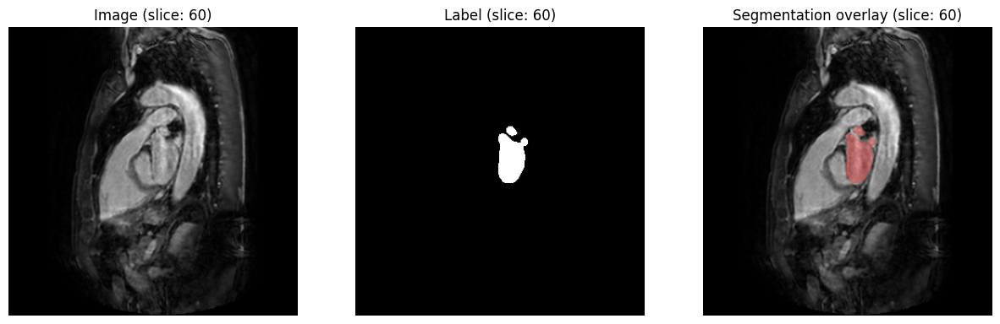

In [24]:
def overlay_segmentation(img, label, transparency=0.3, color=(1, 0, 0)):
    """
    img: Original image (grayscale)
    label: Segmentation label (binary)
    transparency: Transparency factor (0: fully transparent, 1: fully opaque)
    color: Color of overlay, RGB tuple
    """
    img = img / img.max()  # Normalize the image
    img_aux = img.copy()

    overlay_image = np.stack((img, img, img), axis=-1)

    # Define color of overlay
    color_mask = np.zeros_like(overlay_image)
    for i in range(3):
        color_mask[..., i] = color[i]  
    
    # Apply transparency to overlay
    overlay_image[label == 1] = (1 - transparency) * overlay_image[label == 1] + transparency * color_mask[label == 1]

    return overlay_image

def display_slice(slice_index, example_img, example_label, transparency=0.3, color=(1,0,0)):
    # Extract the MRI image and label for the given slice index
    slice_img = example_img[slice_index, :, :] 
    flipped_slice_img = np.flip(slice_img, axis=(0, 1))  # Flip both vertically and horizontally

    slice_label = example_label[slice_index, :, :] 
    flipped_slice_label = np.flip(slice_label, axis=(0, 1))  # Flip both vertically and horizontally

    # Overlay the segmentation mask on the MRI image with transparency
    overlay = overlay_segmentation(flipped_slice_img, flipped_slice_label, transparency=transparency, color=color)

    fig, axes = plt.subplots(1, 3, figsize=(15, 6))  
    axes[0].imshow(flipped_slice_img, cmap='gray')
    axes[0].set_title(f'Image (slice: {slice_index})')
    axes[0].axis('off')

    axes[1].imshow(flipped_slice_label, cmap='gray')
    axes[1].set_title(f'Label (slice: {slice_index})')
    axes[1].axis('off')

    axes[2].imshow(overlay)
    axes[2].set_title(f'Segmentation overlay (slice: {slice_index})')
    axes[2].axis('off')

    plt.show()

mid_slice = example_img.shape[0] // 2 
display_slice(mid_slice, example_img, example_label, transparency=0.3, color=(1,0,0))

In [25]:
def create_gif(image_path, gif_filename='image.gif', duration=0.05, save=False):
    """
    Creates a GIF from all slices of a 3D medical image.
    
    Parameters:
    - image_path: str, path to the 3D image file (.nii format)
    - gif_filename: str, name of the output GIF file
    - duration: float, duration (in seconds) between each frame in the GIF
    """
    # Load the 3D image
    example_img = sitk.ReadImage(image_path)
    example_img = sitk.GetArrayFromImage(example_img)

    # Get the number of slices (shape is (slices, height, width))
    num_slices = example_img.shape[0]

    # Create a list to store frames
    frames = []

    # Loop through each slice and save as an image
    for i in range(num_slices):
        slice_img = example_img[i, :, :]
        slice_img = np.flip(slice_img, axis=(0, 1)) #Flip both vertically and horizontally

        # Normalize the slice for visualization (convert to range 0-255)
        slice_img = (slice_img - np.min(slice_img)) / (np.max(slice_img) - np.min(slice_img)) * 255
        slice_img = slice_img.astype(np.uint8)

        # Convert the numpy array to a PIL Image and append to frames
        pil_img = Image.fromarray(slice_img)
        frames.append(pil_img)

    # Create the GIF in memory
    gif_bytes = io.BytesIO()
    frames[0].save(gif_bytes, format='GIF', save_all=True, append_images=frames[1:], duration=duration*1000, loop=0)
    gif_bytes.seek(0)
    
    # Save the GIF locally if requested
    if save:
        with open(gif_filename, 'wb') as f:
            f.write(gif_bytes.getvalue())
        print(f"GIF saved as {gif_filename}")

    return gif_bytes


def display_gif(gif_bytes):
    """
    Displays a GIF from a BytesIO object in Jupyter Notebooks or IPython environments.
    
    Parameters:
    - gif_bytes: BytesIO object containing GIF data
    """ 
    
    display(IPImage(gif_bytes.getvalue()))

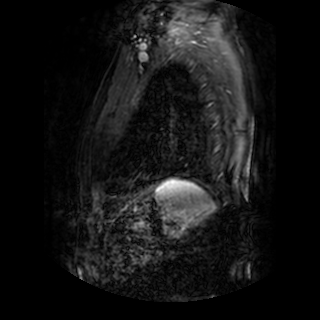

In [26]:
gif_data = create_gif('/kaggle/input/la-segmentation/Task02_Heart/imagesTr/la_005.nii', 'heart_slices.gif', duration=0.07, save=False)
display_gif(gif_data)

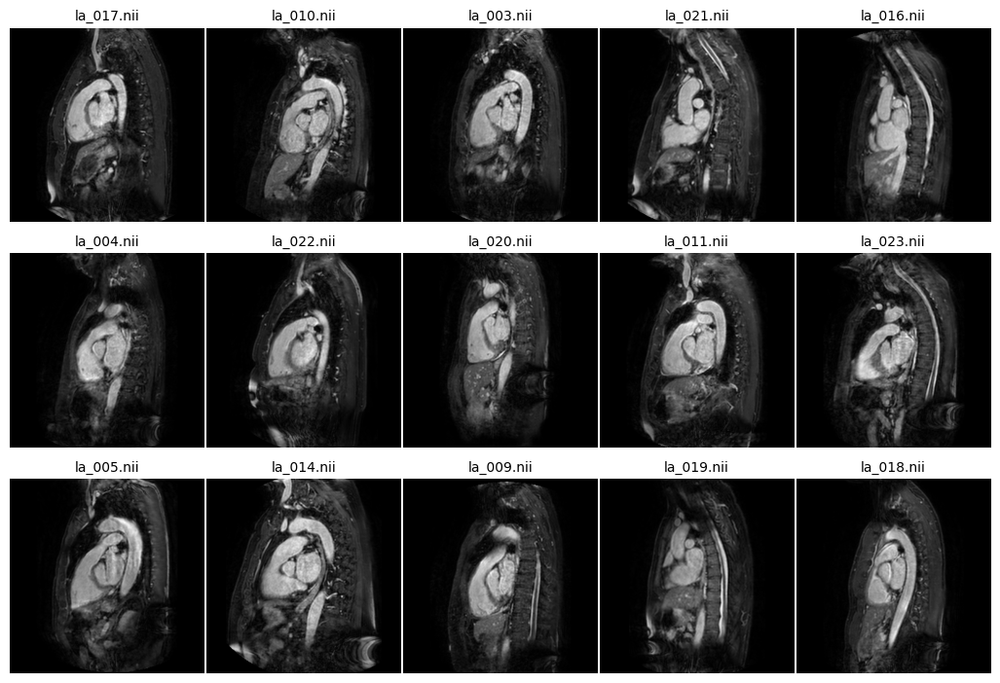

In [27]:
# Full TRAIN data visualization
train_path = '/kaggle/input/la-segmentation/Task02_Heart/imagesTr/'
train_files = [f for f in os.listdir(train_path) if f.endswith('.nii')]

train_images = []
train_names = []  
for file_name in train_files:
    image_path = os.path.join(train_path, file_name)
    img = sitk.ReadImage(image_path)
    img_array = sitk.GetArrayFromImage(img)
    
    slice_idx = img_array.shape[0] // 2  # Middle slice
    img_slice = img_array[slice_idx]
    img_slice = np.flip(img_slice, axis=(0, 1)) #Flip both vertically and horizontally
    img_slice_normalized = (img_slice - np.min(img_slice)) / (np.max(img_slice) - np.min(img_slice))
    train_images.append(img_slice_normalized)
    train_names.append(file_name)

fig, axes = plt.subplots(3, 5, figsize=(13, 9))

for i, ax in enumerate(axes.flat):
    ax.imshow(train_images[i], cmap='gray')
    ax.axis('off')  
    ax.set_title(train_names[i], fontsize=10)  

plt.subplots_adjust(wspace=0.01, hspace=0.01) 
plt.show()

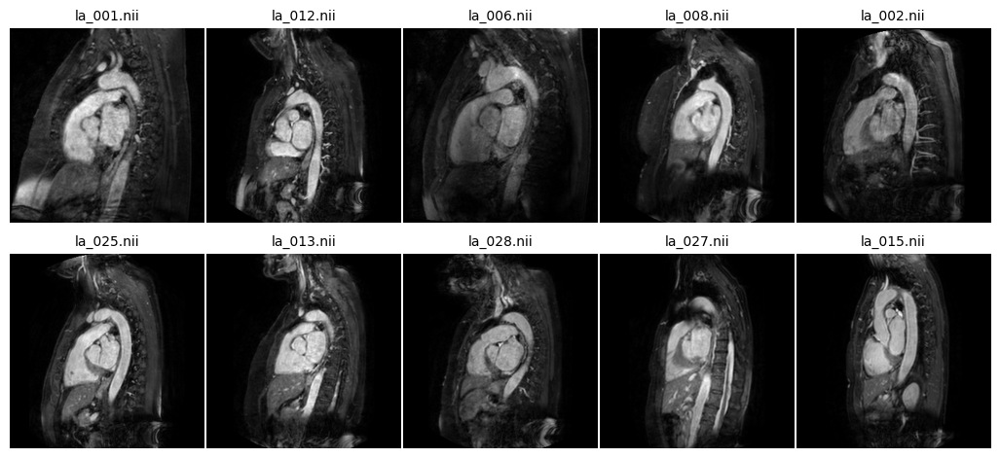

In [28]:
# Full TEST data visualization
test_path = '/kaggle/input/la-segmentation/Task02_Heart/imagesTs/'
test_files = [f for f in os.listdir(test_path) if f.endswith('.nii')]

test_images = []
test_names = []  
for file_name in test_files:
    image_path = os.path.join(test_path, file_name)
    img = sitk.ReadImage(image_path)
    img_array = sitk.GetArrayFromImage(img)
    
    slice_idx = img_array.shape[0] // 2  # Middle slice
    img_slice = img_array[slice_idx]
    img_slice = np.flip(img_slice, axis=(0, 1)) #Flip both vertically and horizontally
    img_slice_normalized = (img_slice - np.min(img_slice)) / (np.max(img_slice) - np.min(img_slice))
    test_images.append(img_slice_normalized)
    test_names.append(file_name)

fig, axes = plt.subplots(2, 5, figsize=(13, 6))

for i, ax in enumerate(axes.flat):
    ax.imshow(test_images[i], cmap='gray')
    ax.axis('off')  
    ax.set_title(test_names[i], fontsize=10)  

plt.subplots_adjust(wspace=0.01, hspace=0.01) 
plt.show()

## Dataset + preprocessing / augmentation

Rotating, Gaussian blur, normalization per patient (over full volume), crop image to remove deadspace
Flipping doesn not have a great effect on tumor segmentation

**Tips for training 3d-UNet:**
* Before training make sure that the data you want to train is normalized and resized for the model. 
* Main purpose of normalization is to make computation efficient by reducing values between 0 to 1 as well as removing noise in data.
* Images used for medical image segmentation are high-resolution three-dimensional (3D) images. To reduce the memory usage on GPU’s, we can use a patch-based method, which divides a large image into small patches and trains the models with these small patches.

**TODO:**
* Bestäm ett rimligt område för crop baserat på visualisering av bilder

In [29]:
import sys

scripts_dir = '/kaggle/input/scripts/other/default/1'
#print(os.listdir(scripts_dir)) - Files in dir
sys.path.append(scripts_dir)

#from train import train, validate, patched_forward
#from utils import CombinedLoss

In [30]:
import glob

# Load images in directories 
data_dir = "/kaggle/input/la-segmentation/Task02_Heart"

train_images = sorted(glob.glob(os.path.join(data_dir, "imagesTr", "*.nii")))
train_labels = sorted(glob.glob(os.path.join(data_dir, "labelsTr", "*.nii")))
train_data_dict = [{"image": image_name, "label": label_name} for image_name, label_name in zip(train_images, train_labels)]

val_images = sorted(glob.glob(os.path.join(data_dir, "imagesVl", "*.nii")))
val_labels = sorted(glob.glob(os.path.join(data_dir, "labelsVl", "*.nii")))
val_data_dict = [{"image": image_name, "label": label_name} for image_name, label_name in zip(val_images, val_labels)]

# Display first image and label in train dict
train_data_dict[15]

{'image': '/kaggle/input/la-segmentation/Task02_Heart/imagesTr/la_023.nii',
 'label': '/kaggle/input/la-segmentation/Task02_Heart/labelsTr/la_023.nii'}

### Transforms

In [31]:
!pip install monai

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [32]:
# TODO, take slice index as input
from monai.transforms import Rotated, RandRotated, RandZoomd, RandAffined, RandGaussianNoised, RandGaussianSmoothd

def visualize_transform(data_dict, img_idx=0, transform=None):
    image, label = data_dict[img_idx]["image"], data_dict[img_idx]["label"]
    
    image_array = sitk.GetArrayFromImage(sitk.ReadImage(image))
    label_array = sitk.GetArrayFromImage(sitk.ReadImage(label))
    
    data = {"image": image_array, "label": label_array}
    
    # Apply transform if provided
    if transform:
        transformed = transform(data)
        image_array, label_array = transformed["image"], transformed["label"]

    mid_slice = image_array.shape[0] // 2
    slice_img = image_array[mid_slice, :, :] 
    slice_label = label_array[mid_slice, :, :] 
    flipped_slice_img = np.flip(slice_img, axis=(0, 1))
    flipped_slice_label = np.flip(slice_label, axis=(0, 1))

    fig, axes = plt.subplots(1, 2, figsize=(6, 3))  
    axes[0].imshow(flipped_slice_img, cmap='gray')
    axes[0].set_title(f'Transformed image (slice: {mid_slice})')
    axes[0].axis('off')

    axes[1].imshow(flipped_slice_label, cmap='gray')
    axes[1].set_title(f'Transformed label (slice: {mid_slice})')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

# TODO - FIX multiple transforms
#transform = Rotated(keys=["image","label"], angle=0.2, mode=["bilinear", "nearest"])
#transform = RandRotated(keys=["image","label"], prob=0.4, range_x=[-0.3, 0.3], mode=["bilinear", "nearest"])
#transform = RandZoomd(keys=["image","label"], prob=0.4, min_zoom=1.1, max_zoom=1.5, mode=["area", "nearest"])
#transform =RandAffined(keys=["image","label"], prob=0.5, shear_range=(0.4,0.4), mode=["bilinear", "nearest"],padding_mode="zeros")
#transform = RandGaussianNoised(keys=["image"], prob=0.9, mean=0, std=0.1)
#transform = RandGaussianSmoothd(keys="image",prob=1.0, sigma_x=(0,3))
#visualize_transform(train_data_dict, img_idx=0, transform=transform)

### Dataset and loader

In [33]:
import torch
from glob import glob
from torch.utils.data import Dataset
import SimpleITK as sitk
import numpy as np

class TrainDataset(Dataset): 
    """
    require_target = True => all returned patches contain atleast some of the target
    preoad_all_images = True => all images are loaded into memory at the start
    """

    def __init__(self, data_dir, labels_dir, patch_size, require_target=False,transform=None, preload_all_images=True, num_patches_per_image=1):
        self.patch_size = patch_size
        self.transform = transform
        self.require_target = require_target
        
        self.data_paths = sorted(glob(data_dir + '/*.nii'))
        self.label_paths = sorted(glob(labels_dir + '/*.nii'))

        self.preload_all_images = preload_all_images
        if preload_all_images:
            self.data = {path_: sitk.GetArrayFromImage(sitk.ReadImage(path_)).astype('float32') for path_ in self.data_paths}
            self.labels = {path_: sitk.GetArrayFromImage(sitk.ReadImage(path_)).astype('int64') for path_ in self.label_paths}

        self.num_patches_per_image = num_patches_per_image

    def __len__(self):
        return len(self.data_paths)
    
    def __getitem__(self, idx):
        if self.preload_all_images:
            image_np = self.data[self.data_paths[idx]]
            label_np = self.labels[self.label_paths[idx]]
        else:
            image  = sitk.ReadImage(self.data_paths[idx])
            label = sitk.ReadImage(self.label_paths[idx])

            image_np = sitk.GetArrayFromImage(image).astype('float32')
            label_np = sitk.GetArrayFromImage(label).astype('int64')

        patches = []
        labels = []
        for _ in range(self.num_patches_per_image):
            if self.require_target:
                image_patch, label_patch = self.random_crop_3d_target(image_np, label_np, self.patch_size)
            else:
                image_patch, label_patch = self.random_crop_3d(image_np, label_np, self.patch_size)
            
            if self.transform:
                array_data = {"image_patch": image_patch, "label_patch": label_patch}
                transformed = self.transform(array_data)
                image_patch, label_patch = transformed["image_patch"], transformed["label_patch"]
                
            image_tensor = torch.as_tensor(image_patch, dtype=torch.float32).unsqueeze(0)
            label_tensor = torch.as_tensor(label_patch, dtype=torch.float32)
            patches.append(image_tensor)
            labels.append(label_tensor)

        return torch.stack(patches, dim=0), torch.stack(labels, dim=0)
    
    def random_crop_3d(self, image, label, patch_size):
        z, y, x = image.shape
        pz, py, px = patch_size
        sz = torch.randint(0, z - pz, (1,)).item()
        sy = torch.randint(0, y - py, (1,)).item()
        sx = torch.randint(0, x - px, (1,)).item()
        return image[sz:sz+pz, sy:sy+py, sx:sx+px], label[sz:sz+pz, sy:sy+py, sx:sx+px]
    
    def random_crop_3d_target(self, image, label, patch_size):
        z, y, x = image.shape
        pz, py, px = patch_size
        
        ones_indices = np.argwhere(label)
        z_min, y_min, x_min = ones_indices.min(axis=0)
        z_max, y_max, x_max = ones_indices.max(axis=0)

        z_patch_min, y_patch_min, x_patch_min = max(0, z_min - pz), max(0, y_min - py), max(0, x_min - px)
        z_patch_max, y_patch_max, x_patch_max = min(z - pz, z_max), min(y - py, y_max), min(x - px, x_max)

        sz = torch.randint(z_patch_min, z_patch_max + 1, (1,)).item()
        sy = torch.randint(y_patch_min, y_patch_max + 1, (1,)).item()
        sx = torch.randint(x_patch_min, x_patch_max + 1, (1,)).item()

        return image[sz:sz+pz, sy:sy+py, sx:sx+px], label[sz:sz+pz, sy:sy+py, sx:sx+px]

        
class TestDataset(Dataset): 
    """
    Test dataset loads the entire image 
    """
    def __init__(self, data_dir, labels_dir=None, transform=None):
        self.transform = transform
        
        self.data_paths = sorted(glob(data_dir + '/*'))
        self.label_paths = sorted(glob(labels_dir + '/*')) if labels_dir is not None else None

    def __len__(self):
        return len(self.data_paths)
    
    def __getitem__(self, index):
        image = sitk.ReadImage(self.data_paths[index])
        image_np = sitk.GetArrayFromImage(image).astype('float32')

        if self.label_paths is not None:
            label = sitk.ReadImage(self.label_paths[index])
            label_np = sitk.GetArrayFromImage(label).astype('int64')
        else:
            label_np = None
        
        #if self.transform:
        #    image_np = self.transform(image_np)

        image_tensor = torch.tensor(image_np, dtype=torch.float32).unsqueeze(0)

        if label_np is not None:
            label_tensor = torch.tensor(label_np, dtype=torch.int64)
            return image_tensor, label_tensor
        else:
            return image_tensor

In [34]:
patch_size = (64, 128, 128)
transform = RandRotated(keys=["image","label"], prob=0.5, range_x=[-0.3, 0.3], mode=["bilinear", "nearest"])
#transform =RandAffined(keys=["image_patch","label_patch"], prob=1.0, shear_range=(0.3,0.3), mode=["bilinear", "nearest"],padding_mode="zeros")
#transform = RandZoomd(keys=["image_patch","label_patch"], prob=0.4, min_zoom=1.1, max_zoom=1.5, mode=["area", "nearest"])
transform = None

train_image_path = '/kaggle/input/la-segmentation/Task02_Heart/imagesTr'
train_label_path = '/kaggle/input/la-segmentation/Task02_Heart/labelsTr'
val_image_path = '/kaggle/input/la-segmentation/Task02_Heart/imagesVl'
val_label_path = '/kaggle/input/la-segmentation/Task02_Heart/labelsVl'

train_dataset = TrainDataset(train_image_path, train_label_path, patch_size, require_target=True, transform=transform, preload_all_images=True, num_patches_per_image=2)
val_dataset = TestDataset(val_image_path, val_label_path)

batch_size = 2
# The effective batch size will be batch_size * num_patches_per_image
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=2)

In [35]:
'''
import torch
from glob import glob
from torch.utils.data import Dataset
import SimpleITK as sitk
import numpy as np

class TrainDataset(Dataset): 
    """
    require_target = True => all returned patches contain atleast some of the target
    preoad_all_images = True => all images are loaded into memory at the start
    """

    def __init__(self, train_dict, patch_size, require_target=False,transform=None, preload_all_images=True, num_patches_per_image=1):
        self.patch_size = patch_size
        self.transform = transform
        self.require_target = require_target
        
        self.train_images = [item["image"] for item in train_dict]
        self.train_labels = [item["label"] for item in train_dict]

        self.preload_all_images = preload_all_images
        if preload_all_images:
            self.data = {path_: sitk.GetArrayFromImage(sitk.ReadImage(path_)).astype('float32') for path_ in self.train_images}
            self.labels = {path_: sitk.GetArrayFromImage(sitk.ReadImage(path_)).astype('int64') for path_ in self.train_labels}

        self.num_patches_per_image = num_patches_per_image

    def __len__(self):
        return len(self.train_images)
    
    def __getitem__(self, idx):
        if self.preload_all_images:
            image_np = self.data[self.train_images[idx]]
            label_np = self.labels[self.train_labels[idx]]
        else:
            image = sitk.ReadImage(self.train_images[idx])
            label = sitk.ReadImage(self.train_labels[idx])

            image_np = sitk.GetArrayFromImage(image).astype('float32')
            label_np = sitk.GetArrayFromImage(label).astype('int64')
            
        array_data = {"image": image_np, "label": label_np}
    
        # Apply transform if provided
        if self.transform: 
            transformed = self.transform(array_data)
            image_np, label_np = transformed["image"], transformed["label"]

        patches = []
        labels = []
        for _ in range(self.num_patches_per_image):
            if self.require_target:
                image_patch, label_patch = self.random_crop_3d_target(image_np, label_np, self.patch_size)
            else:
                image_patch, label_patch = self.random_crop_3d(image_np, label_np, self.patch_size)

            image_tensor = torch.as_tensor(image_patch, dtype=torch.float32).unsqueeze(0)
            label_tensor = torch.as_tensor(label_patch, dtype=torch.float32)

            patches.append(image_tensor)
            labels.append(label_tensor)

        return torch.stack(patches, dim=0), torch.stack(labels, dim=0)
    
    def random_crop_3d(self, image, label, patch_size):
        z, y, x = image.shape
        pz, py, px = patch_size
        sz = torch.randint(0, z - pz, (1,)).item()
        sy = torch.randint(0, y - py, (1,)).item()
        sx = torch.randint(0, x - px, (1,)).item()
        return image[sz:sz+pz, sy:sy+py, sx:sx+px], label[sz:sz+pz, sy:sy+py, sx:sx+px]
    
    def random_crop_3d_target(self, image, label, patch_size):
        z, y, x = image.shape
        pz, py, px = patch_size
        
        ones_indices = np.argwhere(label)
        z_min, y_min, x_min = ones_indices.min(axis=0)
        z_max, y_max, x_max = ones_indices.max(axis=0)

        z_patch_min, y_patch_min, x_patch_min = max(0, z_min - pz), max(0, y_min - py), max(0, x_min - px)
        z_patch_max, y_patch_max, x_patch_max = min(z - pz, z_max), min(y - py, y_max), min(x - px, x_max)

        sz = torch.randint(z_patch_min, z_patch_max + 1, (1,)).item()
        sy = torch.randint(y_patch_min, y_patch_max + 1, (1,)).item()
        sx = torch.randint(x_patch_min, x_patch_max + 1, (1,)).item()

        return image[sz:sz+pz, sy:sy+py, sx:sx+px], label[sz:sz+pz, sy:sy+py, sx:sx+px]


    
class TestDataset(Dataset): 
    """
    Test dataset loads the entire image from a predefined dictionary.
    """
    def __init__(self, test_dict, transform=None):
        self.transform = transform
        
        # Extract images and labels from the dictionary
        self.test_images = [item["image"] for item in test_dict]
        self.test_labels = [item.get("label") for item in test_dict] if "label" in test_dict[0] else None

    def __len__(self):
        return len(self.test_images)
    
    def __getitem__(self, index):
        image = sitk.ReadImage(self.test_images[index])
        image_np = sitk.GetArrayFromImage(image).astype('float32')

        # Check if labels are available
        if self.test_labels is not None:
            label = sitk.ReadImage(self.test_labels[index])
            label_np = sitk.GetArrayFromImage(label).astype('int64')
        else:
            label_np = None
        
        # Apply transformations if provided
        #if self.transform:
        #    image_np = self.transform(image_np)

        # Convert to tensor and add channel dimension
        image_tensor = torch.tensor(image_np, dtype=torch.float32).unsqueeze(0)

        # Return image and label tensors, or only image if label is None
        if label_np is not None:
            label_tensor = torch.tensor(label_np, dtype=torch.int64)
            return image_tensor, label_tensor
        else:
            return image_tensor
'''

'\nimport torch\nfrom glob import glob\nfrom torch.utils.data import Dataset\nimport SimpleITK as sitk\nimport numpy as np\n\nclass TrainDataset(Dataset): \n    """\n    require_target = True => all returned patches contain atleast some of the target\n    preoad_all_images = True => all images are loaded into memory at the start\n    """\n\n    def __init__(self, train_dict, patch_size, require_target=False,transform=None, preload_all_images=True, num_patches_per_image=1):\n        self.patch_size = patch_size\n        self.transform = transform\n        self.require_target = require_target\n        \n        self.train_images = [item["image"] for item in train_dict]\n        self.train_labels = [item["label"] for item in train_dict]\n\n        self.preload_all_images = preload_all_images\n        if preload_all_images:\n            self.data = {path_: sitk.GetArrayFromImage(sitk.ReadImage(path_)).astype(\'float32\') for path_ in self.train_images}\n            self.labels = {path_: si

In [36]:
'''
patch_size = (64, 64, 64)
#transform = RandRotated(keys=["image","label"], prob=0.5, range_x=[-0.3, 0.3], mode=["bilinear", "nearest"])
transform =RandAffined(keys=["image","label"], prob=0.9, shear_range=(0.4,0.4), mode=["bilinear", "nearest"],padding_mode="zeros")
#transform = RandZoomd(keys=["image","label"], prob=0.4, min_zoom=1.1, max_zoom=1.5, mode=["area", "nearest"])

train_dataset = TrainDataset(train_data_dict, patch_size, require_target=True, transform=transform, preload_all_images=True, num_patches_per_image=2)
val_dataset = TestDataset(val_data_dict)

batch_size = 7
# The effective batch size will be batch_size * num_patches_per_image
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=2)
'''

'\npatch_size = (64, 64, 64)\n#transform = RandRotated(keys=["image","label"], prob=0.5, range_x=[-0.3, 0.3], mode=["bilinear", "nearest"])\ntransform =RandAffined(keys=["image","label"], prob=0.9, shear_range=(0.4,0.4), mode=["bilinear", "nearest"],padding_mode="zeros")\n#transform = RandZoomd(keys=["image","label"], prob=0.4, min_zoom=1.1, max_zoom=1.5, mode=["area", "nearest"])\n\ntrain_dataset = TrainDataset(train_data_dict, patch_size, require_target=True, transform=transform, preload_all_images=True, num_patches_per_image=2)\nval_dataset = TestDataset(val_data_dict)\n\nbatch_size = 7\n# The effective batch size will be batch_size * num_patches_per_image\ntrain_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)\nval_loader = torch.utils.data.DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=2)\n'

In [37]:
'''#from dataset import TrainDataset, TestDataset
import torch

train_image_path = '/kaggle/input/task2-heart/Task02_Heart/Task02_Heart/imagesTr'
train_label_path = '/kaggle/input/task2-heart/Task02_Heart/Task02_Heart/labelsTr'
val_image_path = '/kaggle/input/task2-heart/Task02_Heart/Task02_Heart/imagesVl'
val_label_path ='/kaggle/input/task2-heart/Task02_Heart/Task02_Heart/labelsVl'

transform = None
patch_size = (64, 64, 64)
train_dataset = TrainDataset(train_image_path, train_label_path, patch_size, require_target=True, transform=transform, preload_all_images=True, num_patches_per_image=2)
val_dataset = TestDataset(val_image_path, val_label_path)

batch_size = 7
# The effective batch size will be batch_size * num_patches_per_image
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=2)

'''

"#from dataset import TrainDataset, TestDataset\nimport torch\n\ntrain_image_path = '/kaggle/input/task2-heart/Task02_Heart/Task02_Heart/imagesTr'\ntrain_label_path = '/kaggle/input/task2-heart/Task02_Heart/Task02_Heart/labelsTr'\nval_image_path = '/kaggle/input/task2-heart/Task02_Heart/Task02_Heart/imagesVl'\nval_label_path ='/kaggle/input/task2-heart/Task02_Heart/Task02_Heart/labelsVl'\n\ntransform = None\npatch_size = (64, 64, 64)\ntrain_dataset = TrainDataset(train_image_path, train_label_path, patch_size, require_target=True, transform=transform, preload_all_images=True, num_patches_per_image=2)\nval_dataset = TestDataset(val_image_path, val_label_path)\n\nbatch_size = 7\n# The effective batch size will be batch_size * num_patches_per_image\ntrain_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)\nval_loader = torch.utils.data.DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=2)\n\n"

## Utils

In [38]:
import torch.nn as nn
import torch

def dice_coefficient(pred, target, smooth=1.):
    pred = pred > 0.5  # Thresholding to get binary predictions
    intersection = (pred * target).sum()
    return (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

def soft_dice_coefficient(pred, target, smooth=1.):
    intersection = (pred * target).sum()
    return (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

def soft_dice_loss(pred, target, smooth=1.):
    return 1 - soft_dice_coefficient(pred, target, smooth)

def soft_iou(pred, target, smooth=1e-6):
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    return (intersection + smooth) / (union + smooth)

def iou(pred, target, smooth=1e-6):
    pred = pred > 0.5  # Thresholding to get binary predictions
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    return (intersection + smooth) / (union + smooth)

class CombinedLoss(nn.Module):
    """
    Expects logit inputs
    """

    def __init__(self, smooth=1):
        super(CombinedLoss, self).__init__()
        self.bce_loss = nn.BCEWithLogitsLoss()
        self.smooth = smooth

    def forward(self, outputs, targets):
        ce_loss = self.bce_loss(outputs, targets)
        dice = soft_dice_loss(torch.sigmoid(outputs), targets, self.smooth)
        return ce_loss + dice

## Model architecture (3D-UNet)

**Tips for training 3D-UNet:**
* For all layers except the last layer, RelU or eLU can be a good choice of activation function. How ever since segmentation is a pixelwise classification problem, softmax would be an ideal choice for the output layer.
* In semantic segmentation, especially that involves medical images, the usual choice is Dice similarity coefficient. The dice coefficient scores are in the range of 0 to 1 where 1 means that predicted image and groundtruth overlaps perfectly.
* We can use a higher learning rate to start the training when we use a learning rate scheduler. This can help in faster convergence in a controlled manner.

In [39]:
import sys

unet_model = '/kaggle/input/unet/pytorch/default/1/'
sys.path.append(unet_model)

from unet import UNet3D, MultiConv3d  

## Training of model

In [40]:
from collections import defaultdict
from time import time
#from utils import iou, dice_coefficient
import torch
import torch.nn.functional as F

def train_epoch(model, optimizer, loss_fn, train_loader, scheduler, device):
    model.train()
    train_loss = AccumulatingMetric()
    train_iou = AccumulatingMetric()
    train_dice = AccumulatingMetric()
    for batch in train_loader:
        input, target = batch
        # Concatenate the patches along the batch dimension
        input = input.view(-1, *input.shape[2:])
        target = target.view(-1, *target.shape[2:])

        input, target = input.to(device), target.to(device).float()
        optimizer.zero_grad()
        pred_logits = model(input)
        pred_logits = pred_logits.squeeze(1)
        loss = loss_fn(pred_logits, target)
        loss.backward()
        optimizer.step()
        if scheduler is not None:
            scheduler.step()
        pred = torch.sigmoid(pred_logits)
        train_loss.add(loss.item())
        train_iou.add(iou(pred, target).cpu().item())
        train_dice.add(dice_coefficient(pred, target).cpu().item())

    return train_loss.avg(), train_iou.avg(), train_dice.avg()

def validate(model, loss_fn, val_loader, device, patch_size):
    model.eval()
    validation_loss = AccumulatingMetric()
    validation_iou = AccumulatingMetric()
    validation_dice = AccumulatingMetric()
    
    for batch in val_loader:
        # Here I need to separate the input into patches and then merge them after they have all been analyzed. Should I do this with overlap? Yes I should.
        input, target = batch
        input, target = input.to(device), target.to(device).float()
        with torch.no_grad():
            pred_logits = patched_forward(model, input, patch_size, device)
        pred_logits = pred_logits.squeeze(1)
        pred = torch.sigmoid(pred_logits)
        # Calculate the loss, iou and dice coefficient
        loss = loss_fn(pred_logits, target)

        validation_loss.add(loss.item())
        validation_iou.add(iou(pred, target).cpu().item())
        validation_dice.add(dice_coefficient(pred, target).cpu().item())
        
    return validation_loss.avg(), validation_iou.avg(), validation_dice.avg() 

def patched_forward(model, input, patch_size, device, overlap=0.5):
    # This function will take an input image and split it into patches, then run the model on each patch and merge the results.
    batch_size, channels, z, y, x = input.shape
    pz, py, px = patch_size
    stride_z, stride_y, stride_x = int(pz * (1 - overlap)), int(py * (1 - overlap)), int(px * (1 - overlap))

    # Calculate needed padding
    pad_z = (pz - z % pz) if z % pz != 0 else 0
    pad_y = (py - y % py) if y % py != 0 else 0
    pad_x = (px - x % px) if x % px != 0 else 0
    input_padded = F.pad(input, (0, pad_x, 0, pad_y, 0, pad_z))
    padded_z, padded_y, padded_x = input_padded.shape[2:]

    output = torch.zeros((batch_size, channels, padded_z, padded_y, padded_x)).to(device)
    weight_map = torch.zeros((batch_size, channels, padded_z, padded_y, padded_x)).to(device)

    for z_start in range(0, padded_z - pz + 1, stride_z):
        for y_start in range(0, padded_y - py + 1, stride_y):
            for x_start in range(0, padded_x - px + 1, stride_x):
                z_end, y_end, x_end = z_start + pz, y_start + py, x_start + px
                
                patch = input_padded[:, :, z_start:z_end, y_start:y_end, x_start:x_end]
                patch_output = model(patch)
                # Add the output of the patch to the combined output
                output[:, :, z_start:z_end, y_start:y_end, x_start:x_end] += patch_output

                # Keep track of how many values has been added to each region so that we can average them later
                weight_map[:, :, z_start:z_end, y_start:y_end, x_start:x_end] += 1

    # Avoid division by zero in case some areas are not covered by patches
    weight_map = torch.where(weight_map == 0, torch.ones_like(weight_map), weight_map)

    output /= weight_map

    # Remove padding
    output = output[:, :, :z, :y, :x]
    return output


def train(model, optimizer, loss_fn, train_loader, val_loader, scheduler, device, epochs, patch_size, validation_freq=1):
    print(f"Starting training on device {device}...")
    model.to(device)
    train_metrics = defaultdict(list)
    val_metrics = defaultdict(list)

    best_val_loss = float('inf')  # To store the best validation loss
    best_model_state = None       # To store the best model state

    for epoch in range(epochs):
        start_time = time()
        # Training step
        train_loss, train_iou, train_dice = train_epoch(model, optimizer, loss_fn, train_loader, scheduler, device)
        train_metrics["loss"].append(train_loss)
        train_metrics["iou"].append(train_iou)
        train_metrics["dice"].append(train_dice)
        print(f"Epoch {epoch + 1} of {epochs} took {time() - start_time:.2f}s | Training: loss={train_loss:.4f}, iou={train_iou:.4f}, dice={train_dice:.4f}")
    
        # Validation step
        if epoch % validation_freq == validation_freq - 1 or epoch == epochs - 1:
            val_loss, val_iou, val_dice = validate(model, loss_fn, val_loader, device, patch_size)
            val_metrics["loss"].append(val_loss)
            val_metrics["iou"].append(val_iou)
            val_metrics["dice"].append(val_dice)
            print(f"Validation: loss={val_loss:.4f}, iou={val_iou:.4f}, dice={val_dice:.4f}") 

            # Save the best model based on validation loss
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_model_state = model.state_dict()  # Save the model state
                print(f"New best model found with validation loss {val_loss:.4f}, saving model...")

    model.load_state_dict(best_model_state)
    return model, train_metrics, val_metrics


class AccumulatingMetric:
    """Accumulate samples of a metric and automatically keep track of the number of samples."""

    def __init__(self):
        self.metric = 0.0
        self.counter = 0

    def add(self, value):
        self.metric += value
        self.counter += 1

    def avg(self):
        return self.metric / self.counter

In [41]:
model = UNet3D(in_channels=1, out_channels=1, features=[32, 64, 128, 256])
loss_fn = CombinedLoss(smooth=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

epochs = 200
validation_freq = 10

results_train = train(model, optimizer, loss_fn, train_loader, val_loader, None, 
                device, epochs, patch_size=patch_size, validation_freq=validation_freq)

Starting training on device cuda...


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch 1 of 200 took 10.96s | Training: loss=1.5806, iou=0.0943, dice=0.1718
Epoch 2 of 200 took 9.80s | Training: loss=1.5518, iou=0.0855, dice=0.1552
Epoch 3 of 200 took 9.79s | Training: loss=1.4560, iou=0.2006, dice=0.3288
Epoch 4 of 200 took 9.79s | Training: loss=1.4161, iou=0.2520, dice=0.3971
Epoch 5 of 200 took 9.80s | Training: loss=1.3576, iou=0.4124, dice=0.5782
Epoch 6 of 200 took 9.79s | Training: loss=1.3556, iou=0.4123, dice=0.5650
Epoch 7 of 200 took 9.78s | Training: loss=1.3260, iou=0.4605, dice=0.6093
Epoch 8 of 200 took 9.76s | Training: loss=1.3416, iou=0.4863, dice=0.6282
Epoch 9 of 200 took 9.82s | Training: loss=1.2737, iou=0.6078, dice=0.7508
Epoch 10 of 200 took 9.79s | Training: loss=1.2884, iou=0.6268, dice=0.7590
Validation: loss=1.3682, iou=0.5664, dice=0.7192
New best model found with validation loss 1.3682, saving model...
Epoch 11 of 200 took 9.78s | Training: loss=1.2767, iou=0.5987, dice=0.7384
Epoch 12 of 200 took 9.78s | Training: loss=1.2869, iou=0

In [42]:
trained_model, results_train, results_val = results_train

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to 

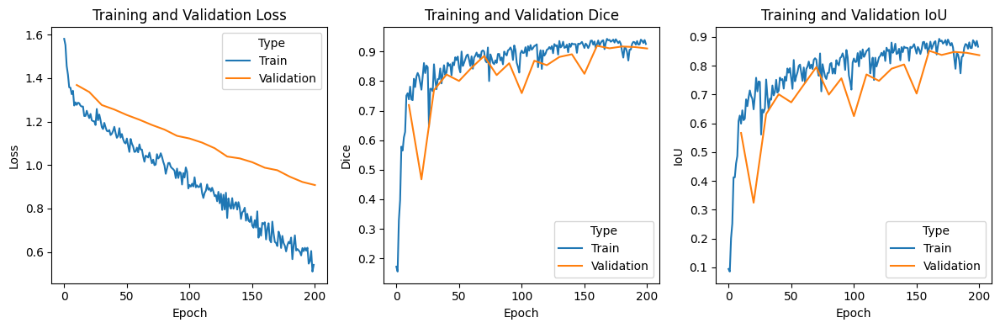

In [43]:
import pandas as pd
import seaborn as sns

# Create DataFrames for easier plotting with Seaborn
df_train_loss = pd.DataFrame({'Epoch': range(len(results_train['loss'])), 'Value': results_train['loss'], 'Metric': 'Loss', 'Type': 'Train'})
df_val_loss = pd.DataFrame({'Epoch': [validation_freq * (1 + x) for x in range(len(results_val['loss']))], 'Value': results_val['loss'], 'Metric': 'Loss', 'Type': 'Validation'})

df_train_dice = pd.DataFrame({'Epoch': range(len(results_train['dice'])), 'Value': results_train['dice'], 'Metric': 'Dice', 'Type': 'Train'})
df_val_dice = pd.DataFrame({'Epoch': [validation_freq * (1 + x) for x in range(len(results_val['dice']))], 'Value': results_val['dice'], 'Metric': 'Dice', 'Type': 'Validation'})

df_train_iou = pd.DataFrame({'Epoch': range(len(results_train['iou'])), 'Value': results_train['iou'], 'Metric': 'IoU', 'Type': 'Train'})
df_val_iou = pd.DataFrame({'Epoch': [validation_freq * (1 + x) for x in range(len(results_val['iou']))], 'Value': results_val['iou'], 'Metric': 'IoU', 'Type': 'Validation'})

# Combine the DataFrames
df = pd.concat([df_train_loss, df_val_loss, df_train_dice, df_val_dice, df_train_iou, df_val_iou])

# Plot using Seaborn
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

sns.lineplot(data=df[df['Metric'] == 'Loss'], x='Epoch', y='Value', hue='Type', ax=axs[0])
axs[0].set_title('Training and Validation Loss')
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Loss')

sns.lineplot(data=df[df['Metric'] == 'Dice'], x='Epoch', y='Value', hue='Type', ax=axs[1])
axs[1].set_title('Training and Validation Dice')
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Dice')

sns.lineplot(data=df[df['Metric'] == 'IoU'], x='Epoch', y='Value', hue='Type', ax=axs[2])
axs[2].set_title('Training and Validation IoU')
axs[2].set_xlabel('Epoch')
axs[2].set_ylabel('IoU')

plt.tight_layout()
plt.show()

In [44]:
torch.save(trained_model.state_dict(), 'cuboid_model.pth')

## Evaluation of model

In [45]:
image, label = val_dataset[0]
image = image.unsqueeze(0)
image = image.to(device)
with torch.no_grad():
    pred_logits = patched_forward(trained_model, image, patch_size, 'cuda')
pred = torch.sigmoid(pred_logits)
pred = pred.squeeze(0, 1)
image = image.squeeze(0, 1)

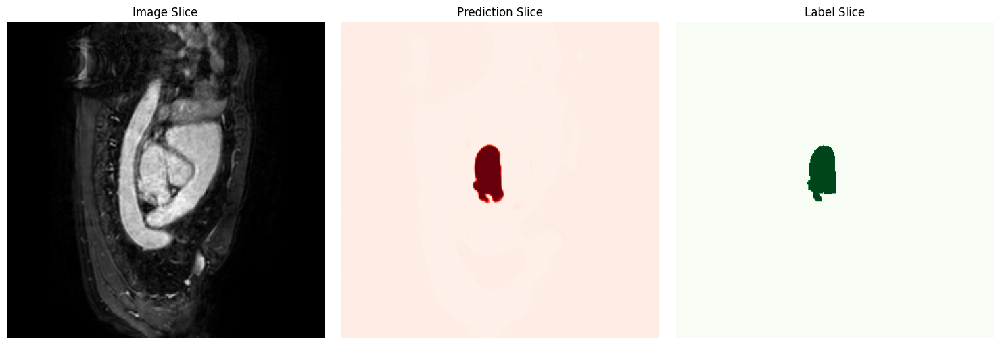

In [46]:
import numpy as np
import matplotlib.pyplot as plt

# Select the 50th slice along the first axis
slice_index = 60

image_slice = image[slice_index].cpu().numpy()
pred_slice = pred[slice_index].cpu().numpy()
label_slice = label[slice_index].cpu().numpy()

# Create the figure and the axes with 3 subplots side by side
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot the original image slice
axs[0].imshow(image_slice, cmap='gray')
axs[0].set_title('Image Slice')
axs[0].axis('off')

# Plot the prediction slice
axs[1].imshow(pred_slice, vmin=0, vmax=1, cmap='Reds')
axs[1].set_title('Prediction Slice')
axs[1].axis('off')

# Plot the label slice
axs[2].imshow(label_slice, cmap='Greens')
axs[2].set_title('Label Slice')
axs[2].axis('off')

# Display the figure
plt.tight_layout()
plt.show()

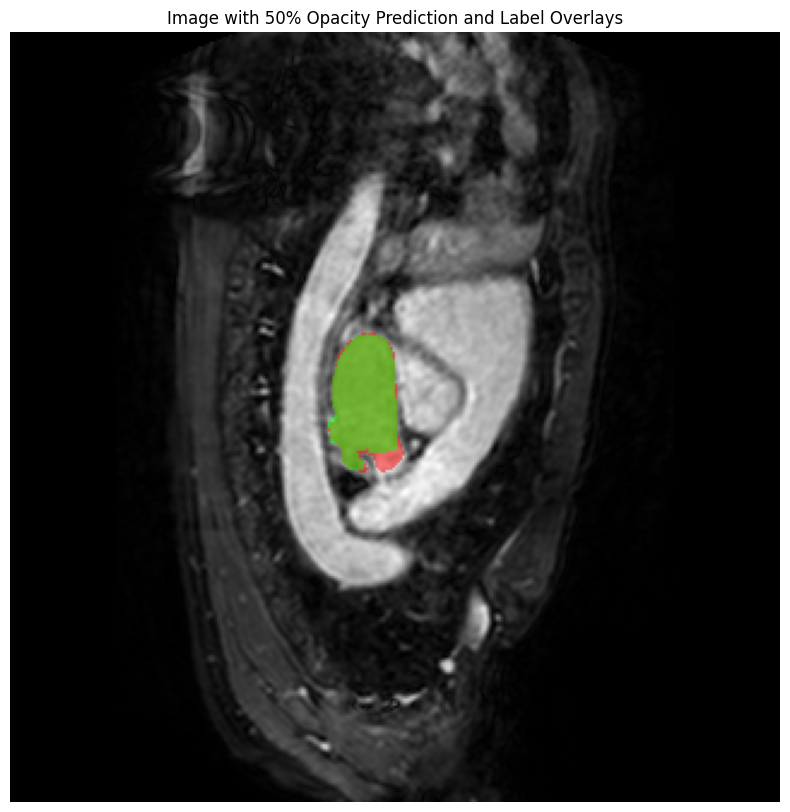

In [50]:
import numpy as np
import matplotlib.pyplot as plt

# Select the 50th slice along the first axis
slice_index = 60
image_slice = image[slice_index].cpu().numpy()
pred_slice = pred[slice_index].cpu().numpy()
label_slice = label[slice_index].cpu().numpy()

pred_slice = (pred_slice > 0.5).astype(np.float32)

# Normalize image slice for visualization (if needed)
image_slice = (image_slice - image_slice.min()) / (image_slice.max() - image_slice.min())

# Create an RGB image from the grayscale slice
image_rgb = np.stack([image_slice]*3, axis=-1)

# Create solid colors for the prediction and label overlays
red_overlay = np.zeros_like(image_rgb)
red_overlay[..., 0] = 1  # Red color for prediction

green_overlay = np.zeros_like(image_rgb)
green_overlay[..., 1] = 1  # Green color for label

# Create the prediction and label masks (expanding dims for compatibility)
pred_mask = np.expand_dims(pred_slice, axis=-1)
label_mask = np.expand_dims(label_slice, axis=-1)

# Set the opacity for the overlays (50% opacity)
opacity = 0.5

# Blend the solid color with the original image using the mask
# First, apply the red overlay for predictions
overlay_image = image_rgb * (1 - pred_mask * opacity) + red_overlay * pred_mask * opacity

# Then, apply the green overlay for labels
overlay_image = overlay_image * (1 - label_mask * opacity) + green_overlay * label_mask * opacity

# Plot the resulting image with the 50% opacity overlays
plt.figure(figsize=(10, 10))
plt.imshow(overlay_image)
plt.title('Image with 50% Opacity Prediction and Label Overlays')
plt.axis('off')
plt.show()